<a href="https://colab.research.google.com/github/XTWLP/CNN/blob/master/GAN/DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%matplotlib inline

In [2]:
!unzip "/content/drive/MyDrive/img_align_celeba.zip" -d "data"

流式输出内容被截断，只能显示最后 5000 行内容。
 extracting: data/img_align_celeba/197600.jpg  
 extracting: data/img_align_celeba/197601.jpg  
 extracting: data/img_align_celeba/197602.jpg  
 extracting: data/img_align_celeba/197603.jpg  
 extracting: data/img_align_celeba/197604.jpg  
 extracting: data/img_align_celeba/197605.jpg  
 extracting: data/img_align_celeba/197606.jpg  
 extracting: data/img_align_celeba/197607.jpg  
 extracting: data/img_align_celeba/197608.jpg  
 extracting: data/img_align_celeba/197609.jpg  
 extracting: data/img_align_celeba/197610.jpg  
 extracting: data/img_align_celeba/197611.jpg  
 extracting: data/img_align_celeba/197612.jpg  
 extracting: data/img_align_celeba/197613.jpg  
 extracting: data/img_align_celeba/197614.jpg  
 extracting: data/img_align_celeba/197615.jpg  
 extracting: data/img_align_celeba/197616.jpg  
 extracting: data/img_align_celeba/197617.jpg  
 extracting: data/img_align_celeba/197618.jpg  
 extracting: data/img_align_celeba/197619.jpg  
 extracting: 

In [3]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manualSeed = 999

print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [4]:
dataroot = "data"

workers = 2

batch_size = 128

image_size = 64

nc = 3

nz = 100

ngf = 64

ndf = 64

num_epochs = 5

lr = 0.0002

betal = 0.5

ngpu = 1

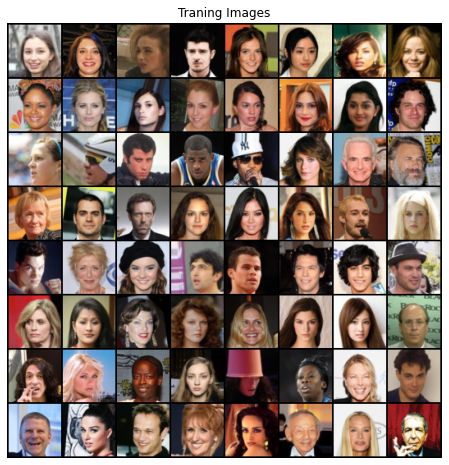

In [5]:
dataset = dset.ImageFolder(root=dataroot,
          transform=transforms.Compose([
          transforms.Resize(image_size),
          transforms.CenterCrop(image_size),
          transforms.ToTensor(),
          transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))                             
          ]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
        shuffle=True, num_workers=workers)
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Traning Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64],padding=2,normalize=True).cpu(),(1,2,0)))

In [6]:
def weights_init(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm') != -1:
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0)

In [7]:
class Generator(nn.Module):
  def __init__(self, ngpu):
    super(Generator, self).__init__()
    self.ngpu = ngpu
    self.main = nn.Sequential(
        nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
        nn.BatchNorm2d(ngf * 8),
        nn.ReLU(True),

        nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ngf * 4),
        nn.ReLU(True),

        nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ngf * 2),
        nn.ReLU(True),

        nn.ConvTranspose2d( ngf * 2, ngf , 4, 2, 1, bias=False),
        nn.BatchNorm2d(ngf),
        nn.ReLU(True),
        
        nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
        nn.Tanh()
    )
  def forward(self, input):
    return self.main(input)

In [8]:
netG = Generator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [9]:
class Discriminator(nn.Module):
  def __init__(self, ngpu):
    super(Discriminator, self).__init__()
    self.ngpu = ngpu
    self.main = nn.Sequential(
        nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf*2),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf*4),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf*8),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
        nn.Sigmoid()
    )
  def forward(self, input):
    return self.main(input)

In [10]:
netD = Discriminator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
  netD = nn.DataParallel(netD, list(range(ngpu)))

netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [11]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1.
fake_label = 0.

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(betal, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(betal, 0.999))

In [12]:
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")

for epoch in range(num_epochs):
  for i, data in enumerate(dataloader, 0):
    netD.zero_grad()
    real_cpu = data[0].to(device)
    b_size = real_cpu.size(0)
    label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

    output = netD(real_cpu).view(-1)

    errD_real = criterion(output, label)

    errD_real.backward()
    D_x = output.mean().item()

    noise = torch.randn(b_size, nz, 1, 1, device=device)

    fake = netG(noise)
    label.fill_(fake_label)

    output = netD(fake.detach()).view(-1)

    errD_fake = criterion(output, label)

    errD_fake.backward()
    D_G_z1 = output.mean().item()

    errD = errD_real + errD_fake

    optimizerD.step()

    netG.zero_grad()
    label.fill_(real_label)

    output = netD(fake).view(-1)

    errG = criterion(output, label)

    errG.backward()
    D_G_z2 = output.mean().item()

    optimizerG.step()

    if i % 50 == 0:
      print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLossG: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
            % (epoch, num_epochs, i, len(dataloader), errD.item(), errG.item(), D_x, D_G_z1, D_G_z1))
    
    G_losses.append(errG.item())
    D_losses.append(errD.item())
    if (iters % 500 == 0 ) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
      with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
      img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

    iters += 1

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.7226	LossG: 5.0653	D(x): 0.5348	D(G(z)): 0.5501 / 0.5501
[0/5][50/1583]	Loss_D: 0.2794	LossG: 24.7322	D(x): 0.8872	D(G(z)): 0.0000 / 0.0000
[0/5][100/1583]	Loss_D: 0.4956	LossG: 8.3385	D(x): 0.7489	D(G(z)): 0.0013 / 0.0013
[0/5][150/1583]	Loss_D: 1.2012	LossG: 4.8501	D(x): 0.5406	D(G(z)): 0.0244 / 0.0244
[0/5][200/1583]	Loss_D: 1.8948	LossG: 5.2677	D(x): 0.2955	D(G(z)): 0.0017 / 0.0017
[0/5][250/1583]	Loss_D: 0.4635	LossG: 5.4275	D(x): 0.8046	D(G(z)): 0.0963 / 0.0963
[0/5][300/1583]	Loss_D: 0.2757	LossG: 2.4318	D(x): 0.8615	D(G(z)): 0.0711 / 0.0711
[0/5][350/1583]	Loss_D: 1.3695	LossG: 3.0243	D(x): 0.3799	D(G(z)): 0.0057 / 0.0057
[0/5][400/1583]	Loss_D: 0.5871	LossG: 2.6702	D(x): 0.6788	D(G(z)): 0.0664 / 0.0664
[0/5][450/1583]	Loss_D: 0.4108	LossG: 4.1812	D(x): 0.7935	D(G(z)): 0.0923 / 0.0923
[0/5][500/1583]	Loss_D: 1.7238	LossG: 7.5347	D(x): 0.9574	D(G(z)): 0.6986 / 0.6986
[0/5][550/1583]	Loss_D: 0.3374	LossG: 5.1200	D(x): 0.8973	D(G(z

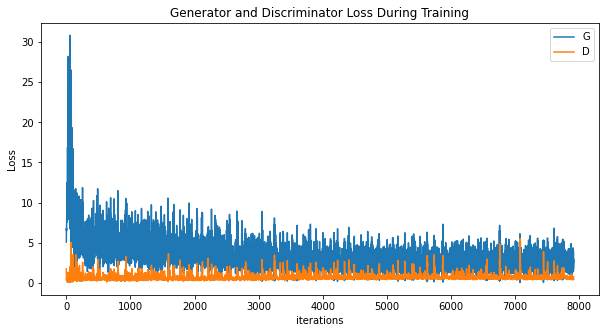

In [13]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

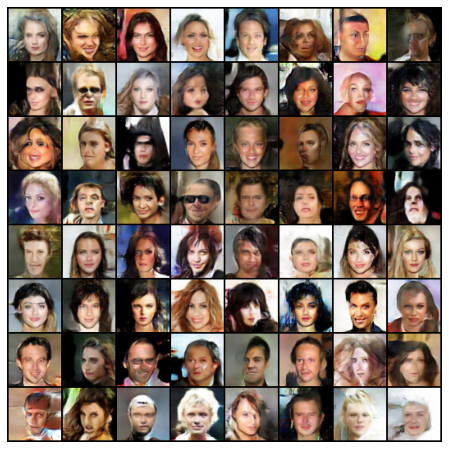

In [14]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

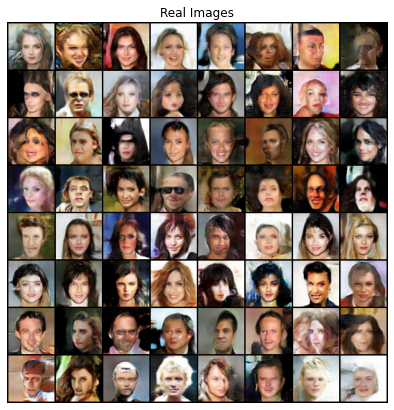

In [16]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()